<a href="https://colab.research.google.com/github/jzorrillamatilla/PHY500/blob/main/Error_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Error analysis in PHY500

The following are some notes on how to use statistical tools to analyze experimental results. In particular, how to estimate the true value of something from noisy data, and how to assess the uncertainty in the estimation. They are not meant to be an authoritative or rigorous source; please share any errors you find!

Some formal references in probability, statistics, and error analyses are the following:

###References

- **Data Analysis: A Bayesian Tutorial (Sivia & Skilling)**: my favorite statistics book. Statistics did not *click* for me until I read it.

- **Numerical Recipes (Press et al)**: the bible of numerical methods in science, great to look for algorithms, not that good for a first exposure.



# Colab / Jupyter notebooks

These notes have been produced in the form of a Colab/Jupyter notebook. Jupyter notebooks are interactive computational environments that allow for the combination of text (in markdown) and code, similar to the environment developed by Wolfram for Mathematica, but open source and compatible with many programing languages (see https://jupyter.org/). Each notebook is a collection of *cells* that can either contain text or code. Their content can be edited by double-clicking on them.

Text cells will display their text when clicking on another cell, or pressing <kbd>Return</kbd> + <kbd>Shift</kbd>. Latex code can inserted to render mathematical expressions.

Code cells can also be run pressing <kbd>Return</kbd> + <kbd>Shift</kbd>, clicking on the *Play* button at their top left corner, or using any of the key combinations in the *Runtime* menu.

Google Colab is a free service offered by Google that allows for the creation, storage, and running of Jupyter notebooks on the cloud.

To learn more, here's an introduction to Jupyter notebooks in general (https://realpython.com/jupyter-notebook-introduction/), and an introduction to Google Colab in particular (https://colab.research.google.com/notebooks/intro.ipynb).

This particular notebook uses Python to display images, some of them interactive, and animations.

In [ ]:
#@title #####Library imports

# Here we import (borrow) libraries whose code we will use through the notebook

import matplotlib.pyplot as plt    # make plots
#plt.rc('text', usetex=True)       # latex not available in Collab for pyplot
%matplotlib inline

import matplotlib.gridspec as gridspec   # subplots

import ipywidgets as widgets             # interactive widgets
from ipywidgets import interact, fixed

from matplotlib import animation, rc   # animations!!!
from IPython.display import HTML

import numpy as np    # arrays

# Measurement in physics, systematic and random errors.

Physicists measure the state of systems through experiments and observations, to explore natural phenomena and test theories.

A measurement consists in a comparison between the magnitude of a property of a system with a standard. For example, measuring a table with a metric measuring tape means comparing its length with a standard such as the meter. The result is then reported as a number followed by a unit, a combination known as a *quantity*. Units convey both the nature of the magnitude ---length, time, mass, etc.--- and the standard used for the comparison. A table can be 300 in long, or 762 cm long, but it cannot just be 57 long.

When repeated, measurements yield different results. This variance can be due to changes in the measured magnitude ---the table may expand with humidity---, changes in the measuring device ---the length of the measuring tape may change with temperature---, or changes in the measuring procedure ---the exact position of the tape with respect to the table may change slightly in each measurement.

A set of measurements is *precise* if its values are close to each other. Conversely, measurements with a large variance have low precision. The spread in the measured values is the result of random errors. The smaller the spread the more precise the measurements. The focus of these notes is how to estimate, and reduce, random errors.

If the same error is present in all measurements, they will be consistently off the true value, no matter how precise they are. These offsets, called *systematic errors*, are not random and result in biased results. Following the table example, if the tape is not well calibrated, the mesasurement will be wrong, regardless of how consistent our measurements are. Measurements that are not biased are also called *accurate*. Accuracy and precission are thus two independent concepts.

Systematic errors are harder to uncover. Strategies to minimize them include measuring relationships between properties over a wide range of values (see section on regression), instrument callibration, and using experimental setups to reproduce known results before exploring new phenomena.

# Reporting measurement uncertainties

The simplest way to report the uncertainty associated with a measurement is to add an *error bar* to the best estimate for the quantity of interest:

$$x_{-\Delta_- x}^{+\Delta_+ x}\,[\mathrm{unit}]$$

For example, $L = 762.5_{-0.1}^{+0.2}\,\mathrm{cm}$ means that the table's length is within the range of [762.4, 762.7] cm, 762.5 cm being the most likely value. This range is called a *credible interval*, *error interval*, or *error bar*. Ideally, a credible interval has an associated probability.

Often times, the most likely value is centered within the credible interval and the uncertainty can be reported as

$$x \pm \Delta x \,[\mathrm{unit}]$$

For example $L = 78.5 \pm 0.2\,\mathrm{cm}$. Note that a result measurement should not be reported with more significant figures than its uncertainty, as those extra digits are meaningless.

## Most likely value and its uncertainty

Given a set of $N$ independent and equivalent measurements $x_i$ of the same magnitude $x$, the most likely true value of $x$ is the arithmetic mean of all the measurements:

$$<x> = \frac{1}{N}\sum_{i=1}^{N}x_i$$

Since it is computed from a subset of all posible measurements, $<x>$ is called the *sample mean*. The sample mean is the optimal choice as long as measurement errors, $n$ or *noise*, are additive, independent of the true value $s$ (sometimes called *signal*), and have zero average:

$$x = s + n ⇒ <x> = <s + n> = <s> + <n> = s + <n> = s$$

The uncertainty on the sample mean depends on how many measurements are made, and how precise each measurement is. The precision of the measurements is givey by their *spread* around the sample mean. This spread can be characterized by the mean difference between the measurements and the sample mean. To avoid cancellations between positive and negative differences, they can be squared before being added together. The result of this operation is the *sample standard deviation*:

$$s_x = \sqrt{<x-<x>>^2} =  \sqrt{\frac{1}{N-1}\sum_{i=1}^N\left(x_i-<x>\right)^2}$$

Dividing the sum of the square of the distances by $N-1$ instead of $N$ reduces the bias of the estimator. It is a technical detail that goes beyond the scope of these notes. Suffice it to say that for large samples it makes no difference whether $N$ or $N-1$ is used. Alternatively, the standard deviation can be computed as the square root ot the mean of the square minus the square of the mean:

$$s_x = \sqrt{<x^2> - 2<x><x> + <x>^2} = \sqrt{<x^2>-<x>^2}$$


For a small sample, each additional measurement can have a relatively large impact on the sample mean. But for a sufficiently large number of measurements the sample mean changes very little, and in the limit of infinite measurements the sample mean converges to the true value of the quantity being measured. The uncertainty in the sample mean depends then also on the number of measurements, $N$.

The uncertainty on the sample mean can be estimated by the *standard deviation of the sample mean*, which is given by

$$s_{<x>}=\frac{s_x}{\sqrt{N}}$$

This is a very powerful result. First, it can be easily computed from the measurements. Second, it shows that random errors can be made arbitrarily small by increasing the number of measurements (as long as we are not limited by instrumental resolution). In practice, as the improvement scales only as $\sqrt{N}$, often times it is easier to reduce the error by improving the precision of the measurements, $s_x$, rather than increase the number of them, $N$.

In summary, given a set of measurements $<x_i>$ of the quantity $x$, we can estimate the most likely true value for $x$ and its uncertainty as:

$$x = <x> \pm \alpha s_{<x>}$$

where $<x>$ is the arithmetic mean

$$<x> = \frac{1}{N}\sum_{i=1}^N x_i$$,

$s_{<x>}$ the standard deviation of the sample mean

$$s_{<x>} = \frac{1}{\sqrt{N}}\sqrt{\frac{1}{N-1}\sum_{i=1}^N\left(x_i-<x>\right)^2}$$

and $\alpha$ is just the number of standard deviations used to define the desired level of uncertainty. The next step is to associate a probability to a given credible interval.

# Probability distributions: going from "spreads" to probabilities

Random errors can be modeled with random variables, which are fully determined by the values they can have and the probability of each value. The sum of the probabilities for all the values, $p_i$, must be equal to one (100%).

$$\sum_i p_i = 1$$

For example, a cubic die has six potential values ---one for each face--- that can be labeled by $X\in${1, 2, 3, 4, 5, 6}. If the die is fair, all values have the same probability, $\frac{1}{6}$, so that the sum of all six probabilities is 1. A loaded die may have different probabilities for each value, but the sum of all must still be equal to 1. The probabilities for a given random variable $x$ can be represented by a graph, with the possible values for $x$ on the horizontal axis, and their corresponding probabilities, $p_i$ on the vertical axis.

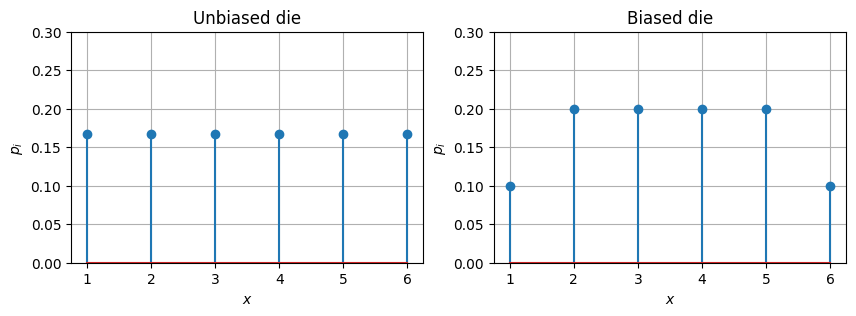

In [ ]:
#@title  ##### Figure 1: Die probability distribution
# Show probability distribution for unbiased and biased die

faces    = np.array([1, 2, 3, 4, 5, 6])
unbiased = np.ones(6) * 1. / 6
biased   = np.array([0.1, 0.2, 0.2, 0.2, 0.2, 0.1])
probs    = (unbiased, biased)
titles   = ("Unbiased die", "Biased die")

fig, ax = plt.subplots(1,2, figsize=(10,3))

for i in range(2):
  ax[i].stem(faces, probs[i]), ax[i].set_ylim(0, 0.3), ax[i].grid()
  ax[i].set_xlabel(r"$x$"), ax[i].set_ylabel(r"$p_i$")
  ax[i].set_title(titles[i])

**Figure 1**. *Left panel:* probability distribution for a fair die. All probabilities are equal to $\frac{1}{6}$. *Right panel:* example of probability for a loaded die, with lower probabilities for the values $x\in${1,6}, $p_i=$0.1, than for the other values, $p_i=$0.2. The sum of all probabilities is still 1.

The probability for $x$ to be within a range of values is the sum of the probabilities for the values within that range. In the example above, the probability for a die to give a value larger than 4 for the unbiased die is

$$p_{\mathrm{unbiased}}(x>4) = p_{\mathrm{unbiased}}(x=5) + p_{\mathrm{unbiased}}(x=6) = \frac{1}{6} + \frac{1}{6} = \frac{1}{3}$$

while for the biased one, it is

$$p_{\mathrm{biased}}(x>4) = p_{\mathrm{biased}}(x=5) + p_{\mathrm{biased}}(x=6) = 0.2 + 0.1 = 0.3$$

When the possible values for a random variable are real numbers, the graph of probabilities becomes a continuous probabilitiy distribution, also called a probability distribution function or pdf, $p(x)$. Only functions with no negative values can be a pdf ---negative probabilities are meaningless. The probability for $x$ to have any value is still a sure event, and should be equal to 1. The sums for discrete distributions become integrals for continuous ones.

$$\int_{-\infty}^{\infty} p(x) dx = 1$$

This integral represents the total area between the pdf and the horizontal axis. We can illustrate the conservation of the total probability with a uniform pdf. This is the distribution for a random variable which can have any value within a given domain, $[a,b]$ with equal probability.

$$p(x) = \frac{1}{b-a}\,\forall a\leq x \leq b$$

Note how the value of $p(x)$, constant, depends on the size of the domain, so that the total area below the pdf remains constant and equal to 1.

In [ ]:
#@title ##### Figure 2: Uniform probability distribution and the conservation of the total probability

@interact(interval=widgets.FloatRangeSlider(min=0,max=10.0,step=1,
                                            description="(a, b)"),
          xlim=fixed((-1,11)), ylim=fixed((0,1.1)))
def plot_uniform_prob(interval, xlim=None, ylim=None):
  '''Plots a uniform distribution'''
  a, b = interval
  assert b > a, f"b = {b} should be bigger than a = {a}"
  p = 1. / (b - a)

  fig, ax = plt.subplots(1,1,figsize=(5,3))
  ax.plot([a,b],[p,p])
  ax.fill_between([a,b],[p,p], alpha=0.2)
  ax.set_xlabel(r"x"), ax.set_ylabel(r"p(x)")
  ax.set_title(r"Uniform distribution")
  ax.grid()
  if xlim is not None: ax.set_xlim(xlim)
  if ylim is not None: ax.set_ylim(ylim)
  plt.show()

  return

interactive(children=(FloatRangeSlider(value=(2.5, 7.5), description='(a, b)', max=10.0, step=1.0), Output()),…

**Figure 2 (interactive).** Uniform pdf defined over an interval $[a,b]$. Move the slider to see how the "height" of the distribution adjusts, as the interval changes, so that the total probability, represented by the area shaded in blue, remains constant and equal to 1.

The probability of a random variable's value to fall within an interval is still the sum (integral) of all the probabilities within that interval:

$$p(a\leq x \leq b) = \int_a^b p(x) dx$$

$$p(x \geq a) = \int_a^{\infty} p(x) dx$$

$$p(x \leq b) = \int_{-\infty}^b p(x) dx$$

We can illustrate these relationships also with a uniform distribution

In [ ]:
# @title ##### Figure3: Uniform distribution and bounded probability

@interact(interval=widgets.FloatRangeSlider(min=0,max=10.0,step=1,
                                            description="(a, b)"),
          bound=widgets.FloatSlider(min=-1,max=11,step=0.2,description="Xmin"),
          xlim=fixed((-2,12)), ylim=fixed((0,1.1)))
def plot_uniform_prob_range(interval, bound, xlim=None, ylim=None):
  '''Plots a uniform distribution'''
  a, b = interval
  assert b > a, f"b = {b} should be bigger than a = {a}"
  p = 1. / (b - a)
  # bound probability
  low   = max(a, bound)
  up    = max(b, bound)
  width = max(0, up-low)
  prob  = p * width

  fig, ax = plt.subplots(1,1,figsize=(5,3))
  ax.plot([a,b],[p,p])
  ax.fill_between([a,b],[p,p], color='b', alpha=0.2)
  ax.axvline(bound, linestyle='--')
  if bound<= b: ax.fill_between([max(a,bound),b], [p,p], color='b', alpha=0.4)
  ax.set_xlabel(r"x"), ax.set_ylabel(r"p(x)")
  ax.set_title(r"Bound probability for uniform distribution")
  ax.grid()
  if xlim is not None: ax.set_xlim(xlim)
  if ylim is not None: ax.set_ylim(ylim)
  plt.text(-1.5, 0.87, r"$p(x\geq${:.2f})={:.2f}".format(bound,prob),
           size=14, bbox=dict(boxstyle='square',fc='white'))
  plt.show()

  return

interactive(children=(FloatRangeSlider(value=(2.5, 7.5), description='(a, b)', max=10.0, step=1.0), FloatSlide…

**Figure 3 (interactive):** Uniform pdf for a random variable $x$ defined within the interval $[a,b]$, and the probability $p(x) \geq X_{\mathrm{min}}$. Drag the sliders to see how different choices of $a$, $b$, and $X_{\mathrm{min}}$ affect the value of the probability.The value of the probability is represented by the darker shade below the curve.

# Normal distribution: (almost) the only distribution you need to analyze errors

There are many different probability distributions. Some of them are "famous" and thus have names. One of The most important distribution for error analysis is the Normal distribution, also known as Gaussian distribution or Bell curve. Its functional form is the following:

$$p(x) = \frac{1}{\sigma \sqrt{2\pi}}\exp\left[{-\frac{1}{2}\left(\frac{x-\mu}{\sigma}\right)^2}\right] \equiv \mathcal{N}\left(\mu,\sigma\right)$$

Where $\mathcal{N}\left(\mu, \sigma\right)$ is just a shorthand for the functional form. The probability peaks at $x=\mu$ and drops exponentially as $x$ moves further from it. The scale that determines how fast the pdf drops is $\sigma$. The mean of this function is $\mu$, and its standard deviation $\sigma$. Thus, $\mu$ also represents the most likely value of $x$, and $\sigma$ its spread/width.

In [ ]:
# @title #####Figure 4: Normal distribution

mu_min,  mu_max,  mu_step  = 0.0, 1.0, 0.1
sig_min, sig_max, sig_step = 0.1, 1.0, 0.1
n_sigma  = 4
n_points = 100

@interact(mu=widgets.FloatSlider(min=mu_min, max=mu_max, step=mu_step,
                                 descriptioin="mu"),
          sigma=widgets.FloatSlider(min=sig_min, max=sig_max, step=sig_step,
                                    description="sigma"),
          nsigma=fixed(n_sigma),
          npoints=fixed(n_points),
          xlim=fixed((mu_min - n_sigma * sig_max, mu_max + n_sigma * sig_max)),
          ylim=fixed((0,1./np.sqrt(2*np.pi)/sig_min)))
def plot_normal(mu=0, sigma=1, nsigma=5, npoints=100, xlim=None, ylim=None):

  xs = np.linspace(mu - nsigma * sigma, mu + nsigma * sigma, npoints)
  ys = np.exp(- (xs - mu)**2 / 2 / sigma**2) / sigma / np.sqrt(2*np.pi)

  fig, ax = plt.subplots(1,1,figsize=(15,3))
  ax.plot(xs, ys)
  # show where the mean falls
  ax.axvline(mu, linestyle='--', color='k', alpha=0.5)
  # show where the sigma levels fall
  for i in range(-3,4):
   if i!=0: ax.axvline(mu+sigma*i, linestyle='--', color='k', alpha=0.5,
                       linewidth=0.5)
  # shade probabilities for different sigma levels
  ax.fill_between(xs[np.where(np.logical_and(xs>=mu-3*sigma,xs<=mu+3*sigma))[0]],
                  ys[np.where(np.logical_and(xs>=mu-3*sigma,xs<=mu+3*sigma))[0]],
                  color='tab:blue', alpha=0.2)
  ax.fill_between(xs[np.where(np.logical_and(xs>=mu-2*sigma,xs<=mu+2*sigma))[0]],
                  ys[np.where(np.logical_and(xs>=mu-2*sigma,xs<=mu+2*sigma))[0]],
                  color='tab:blue', alpha=0.4)
  ax.fill_between(xs[np.where(np.logical_and(xs>=mu-1*sigma,xs<=mu+1*sigma))[0]],
                  ys[np.where(np.logical_and(xs>=mu-1*sigma,xs<=mu+1*sigma))[0]],
                  color='tab:blue', alpha=0.6)
  # annotate the mean and sigma levels
  ax.annotate(r"$\mu$={:.2f}".format(mu), size=14, xy=(mu, 2.6), xytext=(-2,2.5),
              arrowprops=dict(color='tab:gray', shrink=0, width=1, headwidth=8))
  ax.annotate(r"$\sigma$={:.2f}".format(sigma), size=14, xy=(mu+sigma, 3.1), xytext=(2,3),
              arrowprops=dict(color='tab:gray', shrink=0, width=1, headwidth=8))
  ax.annotate(r"$2\,\sigma$={:.2f}".format(2*sigma), size=14, xy=(mu+2*sigma, 2.6), xytext=(2,2.5),
              arrowprops=dict(color='tab:gray', shrink=0, width=1, headwidth=8))
  ax.annotate(r"$3\,\sigma$={:.2f}".format(3*sigma), size=14, xy=(mu+3*sigma, 2.1), xytext=(2,2),
              arrowprops=dict(color='tab:gray', shrink=0, width=1, headwidth=8))

  ax.set_xlabel(r"$x$", fontsize=14), ax.set_ylabel(r"$p(x)$", fontsize=14)
  if xlim is not None: ax.set_xlim(xlim)
  if ylim is not None: ax.set_ylim(ylim)
  plt.show()


interactive(children=(FloatSlider(value=0.0, description='mu', max=1.0), FloatSlider(value=0.1, description='s…

**Figure 4 (interactive):** Normal distribution. Drag the sliders to see how the mean $\mu$ and standard deviation $\sigma$ fully determine the pdf. Shaded regions represent the probability for $x$ to be within a certain number os standard deviations from the mean.

Given a random variable that follows a normal distribution, the probability of its value being within 1 standard deviation of the mean is 68.27%, of being within 2 standard deviations of the mean, 95.45%, and of being within 3 standard deviations of the mean, 99.73%. That is, if a value is found more than 3 standard deviations form the mean, the probability of that being a random fluke is just 1 in 370. This level of confidence is called "three-sigma", and is the minimum standard in the physical sciences to consider a result statistically significant.

In astrophysics, due to the limited number of objects of a certain type present in a given survey, three-sigma is the standard. In particle physics, where experiments can be repeated at will, the standard is "five-sigma", that is, discoveries can only be claimed if their probability of being just the result of chance is less than 1 in 1,744,278.

The Central Limit Theorem (CLT) states that the pdf for the sample mean of $N$ independent measurements of a random variable $x$ is a normal distribution, regardless of what the pdf for $x$, $p(x)$, is.

$$\forall p(x), p\left(<x>\right) = \mathcal{N}\left(\mu,\sigma\right)$$

While only strictly true in the limit of very large $N$, this result is extremely powerful, and the reason why the normal distribution is so important in error analysis. As we saw before, the most likely value for a magnitude $x$, given $N$ independent measurements, is the sample mean. The CTL tells us that the average follows a normal distribution, which allows us to connect the standard deviation of the sample mean to a specific probability.

The CTL is illustrated by the animation in Figure 5.


In [ ]:
# @title #####Figure 5: Ilustration of the CLT (warning: cell runtime ~1 min)
# Animation showing how, as we increase the number of measurements, not only
# the underlying pdf is sampled better, but the mean follows a normal pdf,
# as predicted by the CLT, with known stdev

# Animation parameters
n_measurements = 50    # number of measurements by experiment
n_experiments  = 100   # number of experiments
n_bins         = 50    # number of bins for measurement histograms
n_bins_ave     = 11    # number of bins for averages histograms

# True (underlying) probability distribution: mixture of gaussians ------------
# Define means and standard deviations
mus     = np.array([2.5,  5.0,  9.0])
sigmas  = np.array([0.5,  1.0,  1.5])
weights = np.array([1./3, 1./3, 1./3])

# PDFs of underlying (true) distributions
def gaussian(x, mu, sigma):
  import numpy as np
  return np.exp(-(x-mu)**2 / 2 / sigma**2) / sigma / np.sqrt(2*np.pi)

class GaussianMixture:
  def __init__(self, mus, sigmas, weights=None):
    assert len(mus)==len(sigmas), "Error: different number of mus and sigmas"
    self.mus     = mus
    self.sigmas  = sigmas
    self.weights = weights
    if weights is None:
      self.weights = np.ones(len(self.mus)) / len(self.mus)
    assert len(mus)==len(weights), "Error: different number of mus and weights"
    self.mean = np.sum(self.weights * self.mus)
    self.var  = (np.sum(self.weights * (self.sigmas**2 + self.mus**2))
                  - self.mean**2)
    self.std  = np.sqrt(self.var)

  def pdf(self,x):
    return np.sum(np.array([w * gaussian(x, mu, sigma) for (w, mu, sigma) in
                            zip(self.weights, self.mus, self.sigmas)]
                           ),
                  axis=0)
  def sample(self, points=10):
    # decide from which gaussian each point will be drawn
    mixture_ids = np.random.choice(len(self.weights), size=points)
    # do the sampling
    return np.array([np.random.normal(self.mus[id], self.sigmas[id])
                    for id in mixture_ids])

# To display the pdf of X
x_min, x_max = np.min(mus) - 4*np.max(sigmas), np.max(mus) + 4*np.max(sigmas)
xs_truth     = np.linspace(x_min, x_max, 200)
truth        = GaussianMixture(mus, sigmas, weights)
ys_truth     = truth.pdf(xs_truth)
# To display the pdf of <X>
sigma_ave          = truth.std / np.sqrt(n_measurements)
xave_min, xave_max = truth.mean - 4 * sigma_ave, truth.mean + 4 * sigma_ave
xsave_truth        = np.linspace(xave_min, xave_max, 200)
ysave_truth        = gaussian(xsave_truth, truth.mean, sigma_ave)

# Generate samples for the experiment ------------------------------------------
np.random.seed(1982)   # fix random seed for reproducibility
DATA = []
for i in range(n_experiments):
  DATA.append(truth.sample(n_measurements))
DATA = np.array(DATA)

MEANS = np.mean(DATA, axis=1)   # compute the means for each experiment

# Prepare figure --------------------------------------------------------------
# Set bin edges for histograms
X_BINS    = np.linspace(x_min, x_max, n_bins+1)
XAVE_BINS = np.linspace(xave_min, xave_max, n_bins_ave+1)


fig, ax = plt.subplots(1,3,figsize=(15,4))
plt.close()

# Left panel, cummulative experiment
ax[0].plot(xs_truth, ys_truth, color='tab:gray', lw=2)
_, _, bar_container_all = ax[0].hist([], X_BINS, lw=1,
                              color="tab:blue", alpha=0.5)
ax[0].set_ylim((0,0.3)), ax[0].set_xlim((-2.5, 15.5))
ax[0].set_xlabel(r"$x$"), ax[0].set_ylabel(r"$p(x)$")
ax[0].set_title(r"Cumulative experiments")
label_tally = ax[0].text(0.3*x_max, 1.0 * ys_truth.max(),"", fontsize=14)

# Central panel, single experiment
ax[1].plot(xs_truth, ys_truth, color='tab:gray', lw=2)
_, _, bar_container = ax[1].hist([], X_BINS, lw=1,
                              color="tab:blue", alpha=0.5)
ax[1].set_ylim((0,0.3)), ax[1].set_xlim((-2.5, 15.5))
ax[1].set_xlabel(r"$x$"), ax[1].set_ylabel(r"$p(x)$")
ax[1].set_title(r"Single experiment")
label_exp = ax[1].text(0.4*x_max, 1.0 * ys_truth.max(),"", fontsize=14)

# Right panel, only averages
ax[2].plot(xsave_truth, ysave_truth, color='tab:gray', lw=2)
_, _, bar_container_ave = ax[2].hist([], XAVE_BINS, lw=1,
                              color="tab:blue", alpha=0.5)
#ax[2].set_ylim((0,3)), ax[2].set_xlim((5, 6))
ax[2].set_xlabel(r"$<x>$"), ax[2].set_ylabel(r"$p(<x>)$")
ax[2].set_title(r"Distribution of Means")
label_s_ave = ax[2].text(0.9*xave_max, 0.9 * ysave_truth.max(),"", fontsize=14)

plt.tight_layout(pad=10)


# Animate figure ---------------------------------------------------------------
def animate(frame_number):
  # Update histogram with single experiment data
  data = DATA[frame_number]   # pick the data for that experiment
  n, _ = np.histogram(data, X_BINS, density=True)
  for count, rect in zip(n, bar_container.patches):
    rect.set_height(count)
  label_exp.set_text(r"Experiment: {}".format(frame_number+1))
  # Update histogram with cumulative experiments
  data_all = DATA[:frame_number+1]
  n_all, _ = np.histogram(data_all, X_BINS, density=True)
  for count, rect in zip(n_all, bar_container_all.patches):
    rect.set_height(count)
  label_tally.set_text(r"Measurements: {}".format(len(data_all.flatten())))
  # Update histogram with averages
  data_ave = MEANS[:frame_number+1]
  n_ave, _ = np.histogram(data_ave, XAVE_BINS, density=True)
  for count, rect in zip(n_ave, bar_container_ave.patches):
    rect.set_height(count)
  label_s_ave.set_text(r"$\sigma=${:.2f}""\n"r"$s=${:.2f}".format(sigma_ave,
                                                           np.std(data_ave)))

  return bar_container.patches

ani = animation.FuncAnimation(fig, animate, len(DATA),
                              repeat=False, blit=True)

plt.show()

# Note: below is the part which makes it work on Colab
rc('animation', html='jshtml')
ani

<Figure size 640x480 with 0 Axes>

**Figure 5 (animation):** *Central panel*. Histogram of measurements of $x$ done in individual experiments, drawn from the pdf in grey. Note how 50 measurements per experiment are not sufficient to sample the pdf. *Left panel*. Histogram of cumulative measurements from different experiments, drawn from the pdf in grey. Note how as the number of measurements grows the histogram converges to the underlying pdf. *Right panel*. Cumulative histogram of the sample mean from the experiments. Note how as the number of experiments grows, the histogram converges to a normal distribution with mean equal to the mean of the underlying pdf and standard deviation equal to the standard deviation of the underlying pdf divided by $\sqrt{N}$.

By now you should be convinced that the average of any measurements you perform in your experiments should follow a normal distribution, which means that you can interpret the interval given by the standard deviation of the measurements (divided by the square root of the number of measurements) in terms of probabilities for your credible intervals.

In general, though, you only do an experiment. Is there a way to "verify" that this approximation is correct? Yes, there is! While it goes beyond the scope of these notes, let me sketch how it is done, so that you can search for it in case you're interested:

- Step 1: Generate several/many pseudo experiments resampling your data. Some methods include bootstraping and cross-validation (jacknife, k-fold).
- Step 2: Test whether the set of means obtained from resampling is consistent with a normal distribution (there are several tests, like Shapiro, Kullback-Leibler divergence, etc.)

# Resampling

So far we have developed formulae to estimate most likely values and uncertainties, and we have seen how to interpret them as probabilities since they're often normally distributed. Sometimes, we may need to estimate how our results would change if we have done an experiment many times. One way of doing so, without actually repeating the experiment, is by building different samples from our data. These methods are known as *resampling*, and modern computers make them easy to implement. Two popular methods are called Jacknife and Bootstrap.

In Jacknife, we drop one data point each time, and consider the resulting dataset as an experiment. That is, if we have $N$ data-points, we can generate $N$ samples, each with $N-1$ data points. The resulting $N-1$ means can be used to etimate the standard error of the standard mean as

$$s_{<x>,jack}=\sqrt{N}s_{<x_i>}$$


In Bootstrapping, we generate new samples by picking randomnly $N$ data points with replacement (some will be thus repeated). While it is possible to generate a much larger number of samples through bootstraping than with jacknife, many of them start being repeated, and do not add much value.

As an example, let's illustrate how to use both methods to estimate the uncertainty on the mean for an experiment whose underlying distribution is a Gaussian.



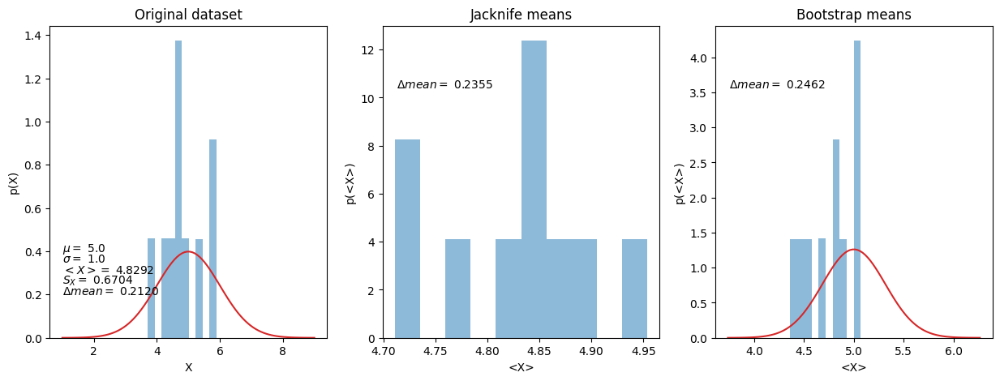

In [ ]:
# @title #####Figure 6: Ilustration of resampling

@interact(n=widgets.IntSlider(min=10, max=1000, step=10,
                                 descriptioin="n"))
def resampling_fig(n):
  np.random.seed(1778)   # fix random seed for reproducibility
  # Define underlying distribution
  mean  = 5.0
  sigma = 1.0

  # Get the pdf for plotting purposes
  x   = np.linspace(mean-4*sigma, mean+4*sigma, 100)
  pdf = gaussian(x, mean, sigma)

  # Sample the distribution
  #n    = 1000
  data = np.random.normal(mean, sigma, n)

  # Let's estimate the mean and the standard deviation using formulas
  sample_mean         = np.mean(data)
  sample_std          = np.std(data, ddof=1)
  std_err_sample_mean = sample_std / np.sqrt(n)

  # Theoretical true pdf for mean
  sigma_mean = sigma / np.sqrt(n)
  x_mean     = np.linspace(mean-4*sigma_mean, mean+4*sigma_mean, 100)
  pdf_mean   = gaussian(x_mean, mean, sigma_mean)

  # Let's use jacknife to figure out the uncertainty of the mean
  jack_means = []
  for i in range(n):
    new_data = np.delete(data,i, axis=0)
    jack_means.append(np.mean(new_data))
  jack_means = np.array(jack_means)
  jack_err_sample_mean = np.sqrt(n) * np.std(jack_means, ddof=1)

  # Let's use bootstrap, with the same number of samples as the jacknife
  boot_means = []
  for i in range(n):
    new_data = np.random.choice(data, n, replace=True)
    boot_means.append(np.mean(new_data))
  boot_means = np.array(boot_means)
  boot_err_sample_mean = np.std(boot_means, ddof=1)

  # Show grafically the results
  fig, ax = plt.subplots(1,3, figsize=(15,5))
  # First, show the original data
  _ = ax[0].hist(data, density=True, alpha=0.5)
  _ = ax[0].plot(x, pdf, color='tab:red')
  _ = ax[0].text(x.min(), pdf.max(), r"$\mu = $ {}".format(mean))
  _ = ax[0].text(x.min(), pdf.max() - 0.050, r"$\sigma = $ {}".format(sigma))
  _ = ax[0].text(x.min(), pdf.max() - 0.100, r"$<X> = $ {:.4f}".format(sample_mean))
  _ = ax[0].text(x.min(), pdf.max() - 0.150, r"$S_X = $ {:.4f}".format(sample_std))
  _ = ax[0].text(x.min(), pdf.max() - 0.200, r"$\Delta mean = $ {:.4f}".format(std_err_sample_mean))
  _ = ax[0].set_xlabel(r"X")
  _ = ax[0].set_ylabel(r"p(X)")
  _ = ax[0].set_title(r"Original dataset")
  # Second, show jacknifed means
  _ = ax[1].hist(jack_means, density=True, alpha=0.5)
 # _ = ax[1].plot(x_mean, pdf_mean, color='tab:red')
  _ = ax[1].text(ax[1].get_xlim()[0] + 0.05 *
   (ax[1].get_xlim()[1]-ax[1].get_xlim()[0]), 0.8 * ax[1].get_ylim()[1],
                 r"$\Delta mean = $ {:.4f}".format(jack_err_sample_mean))
  _ = ax[1].set_xlabel(r"<X>")
  _ = ax[1].set_ylabel(r"p(<X>)")
  _ = ax[1].set_title(r"Jacknife means")
  print(ax[1].get_xlim()[0] + 0.05 * (ax[1].get_xlim()[1]-ax[1].get_xlim()[0]))

  # Third, show bootstrapped means
  _ = ax[2].hist(boot_means, density=True, alpha=0.5)
  _ = ax[2].plot(x_mean, pdf_mean, color='tab:red')
  _ = ax[2].text(ax[2].get_xlim()[0] + 0.05 *
  (ax[2].get_xlim()[1]-ax[2].get_xlim()[0]), 0.8 * ax[2].get_ylim()[1],
                 r"$\Delta mean = $ {:.4f}".format(boot_err_sample_mean))
  _ = ax[2].set_xlabel(r"<X>")
  _ = ax[2].set_ylabel(r"p(<X>)")
  _ = ax[2].set_title(r"Bootstrap means")

  plt.show()

**Figure 6 (interactive):** *Left panel*. Histogram of measurements of $x$ done in individual experiments, drawn from the pdf in red (Gaussian of mean 5 and standard deviation 1). Overlayed, the sample mean, and standard deviation estimated from the data, as well as the standard error on the sample mean from formula. *Central panel*. Histogram of means from Jacknife samples, with estimated standard error on the sample mean. *Right panel*. Histogram of means from Bootstrap samples, with estimated standard error on the sample mean. Note how all the standard errors on the sample mean are similar and converge as the number of measurements increases.

# Instrumental precision

For every measuring device there is a minimum difference between magnitudes that can be accurately measured, the instrument's precision. For example, it is not possible to measure lengths to a precision of 1/10th of a mm using a ruler whose smaller subdivisions are mm. If a series of measurements have zero standard deviation (they're all the same), chances are their precision is being limited by that of the instrument used. In this case, or in general when the standard deviation of a series of measurements is smaller than the precision of the instrument used, it is customary to use the precision of the instrument instead of the standard deviation as the standard error for a single measurement. For example, if you use a measuring tape with a precision of 1 mm, and find that repeated measurements of the table always yield the same value of 762 mm, that does not mean that this is the true value of the table, but that we cannot distinguish lengths that differ in less than a mm, and our best estimate for the length of the table would be $762 \pm 1$ mm.


# Derived magnitudes

Often times, we are not interested in knowing a magnitude that we can measure directly, but rather one that can be derived from direct measurements. For example, imagine you want to know the resistance of a component in a circuit. It is possible to measure simultaneously the electric current going through it, $I$, using an ampmeter and the drop in voltage across it, $V$, using a voltmeter. Then, Ohm's law gives us the resistance:

$$R = \frac{V}{I}$$

We can repeat many times the measurements, $\{V_i, I_i\}$, resulting in many derived values $R_i$. The best estimate for the resistance will be the mean of all these derived values, and its uncertainty will be given by the standard deviation of the sample mean. Nothing new for now. Alas, the uncertainty in the measurements of voltage and intensity may have a different impact on the final estimate of the resistance, due to different precision of the instruments, or a different sensitivity of the resistance to each of the measured variables. Knowing what the contribution of each source of uncertainty is could inform changes in the experimental setup. Furthermore, experiments are designed with an error budget in mind, and understanding the impact of each variable on it is key for good experimental design.


# Propagation of uncertainty, error budget and experimental design

If the variable of interest is a linear combination of measured variables, its standard deviation can be written as a function of the stantard deviation of the variables, as long as thse variables are independent (uncorrelated). From the definition of standard deviation, it can be shown that

$$y = \sum_i a_i x_i ⇒ \sigma_y^2 = \sum_i a_i^2 \sigma_{x_i}^2$$

Most functions are not linear, but can be linearized locally around the (true) value of the variable, using a Taylor expansion. The coefficients of the linear combination are the partial derivatives, which give the sensitivity of the variable of interest to the measured variables. Then, we can write the standard deviation we are interested in as

$$s_y = \sqrt{\sum_i \left(\frac{\partial y}{\partial x}\right)^2 s_{x_i}^2}$$

where $s_{x_i}$ can be estimated from the sample standard deviation for each measured variable.

For the example of measuring a resistance, the standard deviation is then:

$$s_R=\sqrt{\left(\frac{\partial R}{\partial V}\right)^2s_V^2 + \left(\frac{\partial R}{\partial I}\right)^2s_I^2} = \sqrt{\frac{s_V^2}{I^2} + \frac{V^2}{I^4}s_I^2}$$

and if we are interested in the relative uncertainty, we just need to divide by the value of the resistance

$$\frac{s_R}{R} = \sqrt{\frac{s_V^2}{V^2} + \frac{s_I^2}{I^2}}$$

From here it is clear that meausuring the resistance at high voltage (and a corresponding high current) will yield the smallest relative error. Given a cost function for power supplies, voltmeters and ampmeters, and a budget, it is possible to find the combination of instruments that will yield the most precise measurement of the resistance.

Let's see with an example how this works:

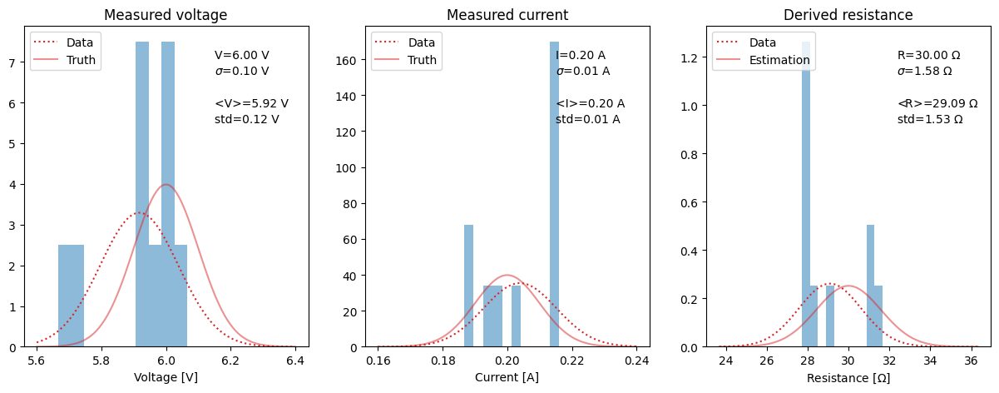

In [ ]:
# @title #####Figure 6: Ilustration of error propagation

# Measurements for the voltage and intensity are drawn from two Gaussians
v_true = 6.0   # true value of voltage, will be mean of gaussian
v_sig  = 0.1   # true uncertainty from voltmeter

j_true = 0.2   # true value of current
j_sig  = 0.01  # ampmeter uncertainty

n_sig = 4   # number of sigmas to plot the pdfs

@interact(measurements=widgets.IntSlider(min=10, max=200, step=10, value=10,
                                 description="measurements"))
def plot_derived(measurements):

  # compute true pdfs for v and i
  v_pts = np.linspace(v_true-n_sig*v_sig, v_true+n_sig*v_sig, 100)
  v_true_pdf = gaussian(v_pts, v_true, v_sig)
  j_pts = np.linspace(j_true-n_sig*j_sig, j_true+n_sig*j_sig, 100)
  j_true_pdf = gaussian(j_pts, j_true, j_sig)

  # pdf for r based on error propagation
  r_true = v_true / j_true
  r_sig  = np.sqrt(v_sig**2 / j_true**2 + j_sig**2 * v_true**2 / j_true**4)
  r_pts  = np.linspace(r_true-n_sig*r_sig, r_true+n_sig*r_sig, 100)

  r_true_pdf = gaussian(r_pts,r_true, r_sig)

  # Sample the true distributions (do the experiment)
  n = measurements   # number of measurements **********************************

  np.random.seed(1982)   # fix random seed for reproducibility

  vs = np.random.normal(v_true, v_sig, n)   # individual voltage measurements
  js = np.random.normal(j_true, j_sig, n)   # individual current measurements
  rs = vs / js   # derived estimates for resistance

  # measure distributions from measurements
  v_mean = np.mean(vs)
  v_std = np.std(vs)
  j_mean = np.mean(js)
  j_std = np.std(js)
  r_mean = np.mean(rs)
  r_std = np.std(rs)

  v_pdf = gaussian(v_pts, v_mean, v_std)
  j_pdf = gaussian(j_pts, j_mean, j_std)
  r_pdf = gaussian(r_pts, r_mean, r_std)

  # Make the plot ----------------------------------------------------------------
  fig, ax = plt.subplots(1,3, figsize=(15,5))

  # voltage
  _ = ax[0].hist(vs, density=True, alpha=0.5)
  _ = ax[0].plot(v_pts, v_pdf, ':', color='tab:red', label=r'Data')
  _ = ax[0].plot(v_pts, v_true_pdf, '-', color='tab:red', alpha=0.5, label=r'Truth')
  _ = ax[0].text(v_true+1.5*v_sig, 0.90*ax[0].get_ylim()[1], r'V={:.2f} V'.format(v_true))
  _ = ax[0].text(v_true+1.5*v_sig, 0.85*ax[0].get_ylim()[1], r'$\sigma$={:.2f} V'.format(v_sig))
  _ = ax[0].text(v_true+1.5*v_sig, 0.75*ax[0].get_ylim()[1], r'<V>={:.2f} V'.format(v_mean))
  _ = ax[0].text(v_true+1.5*v_sig, 0.70*ax[0].get_ylim()[1], r'std={:.2f} V'.format(v_std))
  _ = ax[0].legend(loc=2)
  ax[0].set_xlabel(r'Voltage [V]'), ax[0].set_title(r'Measured voltage')

  # current
  _ = ax[1].hist(js, density=True, alpha=0.5)
  _ = ax[1].plot(j_pts, j_pdf, ':', color='tab:red', label=r'Data')
  _ = ax[1].plot(j_pts, j_true_pdf, '-', color='tab:red', alpha=0.5, label=r'Truth')
  _ = ax[1].text(j_true+1.5*j_sig, 0.90*ax[1].get_ylim()[1], r'I={:.2f} A'.format(j_true))
  _ = ax[1].text(j_true+1.5*j_sig, 0.85*ax[1].get_ylim()[1], r'$\sigma$={:.2f} A'.format(j_sig))
  _ = ax[1].text(j_true+1.5*j_sig, 0.75*ax[1].get_ylim()[1], r'<I>={:.2f} A'.format(j_mean))
  _ = ax[1].text(j_true+1.5*j_sig, 0.70*ax[1].get_ylim()[1], r'std={:.2f} A'.format(j_std))
  _ = ax[1].legend(loc=2)
  ax[1].set_xlabel(r'Current [A]'), ax[1].set_title(r'Measured current')

  # resistance
  _ = ax[2].hist(rs, density=True, alpha=0.5)
  _ = ax[2].plot(r_pts, r_pdf, ':', color='tab:red', label=r'Data')
  _ = ax[2].plot(r_pts, r_true_pdf, '-', color='tab:red', alpha=0.5, label=r'Estimation')
  _ = ax[2].text(r_true+1.5*r_sig, 0.90*ax[2].get_ylim()[1], r'R={:.2f} $\Omega$'.format(r_true))
  _ = ax[2].text(r_true+1.5*r_sig, 0.85*ax[2].get_ylim()[1], r'$\sigma$={:.2f} $\Omega$'.format(r_sig))
  _ = ax[2].text(r_true+1.5*r_sig, 0.75*ax[2].get_ylim()[1], r'<R>={:.2f} $\Omega$'.format(r_mean))
  _ = ax[2].text(r_true+1.5*r_sig, 0.70*ax[2].get_ylim()[1], r'std={:.2f} $\Omega$'.format(r_std))
  _ = ax[2].legend(loc=2)
  ax[2].set_xlabel(r'Resistance [$\Omega$]'), ax[2].set_title(r'Derived resistance')

  plt.show()

**Figure 6 (interactive):** *Left Panel* Histogram of voltage measurements, sampled from a Gaussian distribution (continuous, red). Dotted (red) is the estimated Gaussian distribution from the sample. *Central panel*. Same as left panel, but for the electric current. *Right panel*. Histogram of resistance *measurements* derived from the voltage and current measurements. In red (continuous) is the estimated Gaussian from the voltage and intensity samples. In red (dotted) best Gaussian distribution fit for sample derived values. Both converge as the number of measurements increase.

# Functional dependency of variables: fitting a line to data

In our previous example, Ohm's law implies a linear relationship between the current going through a resistance and the drop in electric potential between its two ends.

$$V = R I$$

So far, we have tried to figure out the value of $R$ by repeating many times measurements for a fixed current and voltage. An alternative way to find a derived parameter is to measure the drop in voltage, the *dependent* variable $V$, for different values of the current going through the resistance, the *independent* variable $I$. Once we have a set of data points $\{I_i, V_i\}$ we can find the value of $R$ that *best fits the data* given the relationship $V = R I$. In general, this method is more robust to systematic errors (for example, zero-setting errors). Furthermore, it allows to validate the functional form of the relationship between variables ---in this example, if the relationship is not linear, that will become evident when graphing the data.

The intuition behind fitting a line to data is that the most likely parameters that define the line will be those that generate a line that is as close to all the data points as possible. Given a data point $\{x_i, y_i\}$ and a function $y=f(x,\alpha_j)$ where $\alpha_j$ are a series of parameters we want to fit, we can use the difference between the measured $y_i$ and the predicted $f(x_i, \alpha_i)$, or residual, as a figure of merit. Since the difference can be positive or negative, and we just care about the distance, not its sign, we can square it. Also, if we have different measurements (data points), and they're equivalent (same expected uncertainty), we can add them together in what is known as the sum of squared residuals

$$S = \sum_i \left(y_i - f(x_i, \alpha_j)\right)^2$$

By minimizing this figure of merit, we can find the parameters $\{\alpha_j\}$ that best fit the data. This is an optimization problem that can be easily solved with calculus

$$\frac{\partial S}{\partial \alpha_i} = 0\,\,\, \forall \alpha_j$$

So far, we are assuming that there are no uncertainties in either the measurements of $x_i$ or $y_i$. If that were the case, there would be a set of parameters $\alpha_j$ that allow the line to pass through all points, *exactly*. It is often the case that the uncertainty on the dependent variable, $\sigma_i$ is larger than that of the independent variables. This may be because, for example, we fix the value of $x$ and perform several measurements of $y$. If that is the case, it makes sense to weight the residuals by those uncertainties, and this new figure of merit is called *chi-square*, $\chi^2$

$$\chi^2 = \sum_i \frac{\left(y_i-f(x_i,\alpha_j)\right)^2}{\sigma_i^2}$$

Turns out that minimizing $\chi^2$ yields the most likely values for the parameters $\alpha_j$, as long as the probability distributions for $y_i$ are Gaussians of variance $\sigma_i^2$. If the uncertainty is the same for all the data-points, minimizing $\chi^2$ is equivalent to minimizing $S$.

When the uncertainties on the independent variables are not negligible compared to those on the dependent variable, the residual is not a good definition for distance any more, and the problem of finding the optimal parameters becomes more complex. The best way is to characterize the probability distribution for each data point ---for example, as uncorrelated Gaussians in the independent and dependent variable---, and sample these distributions to generate many optimal sets of parameters from which their probability distribution can be estimated. The benefit of this approach is that we get an estimate on the uncertainty of the parameters. The cost is mostly computational.

For general functions $f(x,\alpha_j)$, the optimization problem can be complex, and it is best to use any of the many optimization packages avaiable (for example, scipy.optimize). It is worth exploring the case in which the relationship undeer study is linear. The reason is that it is very common in Physics, and it is easy to find analytical formulae for the best fit parameters and their uncertainties.

# Linear Regression

Let's consider a linear relationship between an independent variable $x$ and a dependent variable $y$.

$$y(x) = a_1 + a_2 x$$

And imagine we have $N$ measurements $\{x_i, y_i\}$, where the uncertainty on $x_i$ is negligible compared to the uncertainty in $y_i$, $\sigma_i$ (not necessarily the same for each data point). This is not an uncommon situation, for often times the value of the independent variable can be set within the instrumental precision of the experimental setup. In this siguation, $\chi^2$ is

$$\chi^2 = \sum_{i=1}^N\frac{\left(y_i-a_1-a_2x_i\right)^2}{\sigma_i^2}$$

Equaling the derivatives of this figure of merit with respect to $a_1$ and $a_2$ to zero yields two equations that are linear on $a_1$ and $a_2$. These equations can be easily solved yielding the following best fit values for the parameters

$$a_1 = \frac{1}{\Delta}\left(\sum_{i=1}^N \frac{x_i^2}{\sigma_i^2}\sum_{i=1}^N\frac{y_i}{\sigma_i^2} - \sum_{i=1}^N \frac{x_i}{\sigma_i^2}\sum_{i=1}^N \frac{x_i y_i}{\sigma_i^2}\right)$$

$$a_2 = \frac{1}{\Delta}\left(\sum_{i=1}^N \frac{1}{\sigma_i^2}\sum_{i=1}^N\frac{x_i y_i}{\sigma_i^2} - \sum_{i=1}^N \frac{x_i}{\sigma_i^2}\sum_{i=1}^N \frac{y_i}{\sigma_i^2}\right)$$

$$\Delta = \sum_{i=1}^N \frac{1}{\sigma_i^2}\sum_{i=1}^N\frac{x_i^2}{\sigma_i^2} - \left(\sum_{i=1}^N \frac{x_i}{\sigma_i^2}\right)^2$$

with uncertainties given by

$$\sigma_{a_1} = \sqrt{\frac{1}{\Delta}\sum_{i=1}^N\frac{x_i^2}{\sigma_i^2}}$$

$$\sigma_{a_2} = \sqrt{\frac{1}{\Delta}\sum_{i=1}^N\frac{1}{\sigma_i^2}}$$

If you do not know $\sigma_i$, you can estimate a single $\sigma_y$ from the data:

$$\sigma_y = \sqrt{\frac{1}{N-2}\sum_{i=1}^N\left(y_i-a_1-a_2x_i\right)^2}$$

Then, use this value in the formulas for the best fit parameters $a_1$ and $a_2$ (or 1, since a constant value for $\sigma_i$ cancels out), and the uncertainties become

$$\sigma_{a_1} = \sigma_y \sqrt{\frac{1}{\Delta}\sum_{i=1}^Nx_i^2}$$

$$\sigma_{a_2} = \sigma_y \sqrt{\frac{N}{\Delta}}$$

In practice you will rarely use these formulas, but rather a software tool to yield these results (from excel to a publicly available library like scipy.optimize). If the software you use does not provide uncertainties for $a_1$ and $a_2$ you can estimate them through sampling. For example, re-compute the best values $a_{1,i}$ and $a_{2,i}$ dropping one data point each time (Jacknife resampling), then use the standard deviation of these estimates as a measurement of their uncertainty.




[Example: formulas vs sampling]




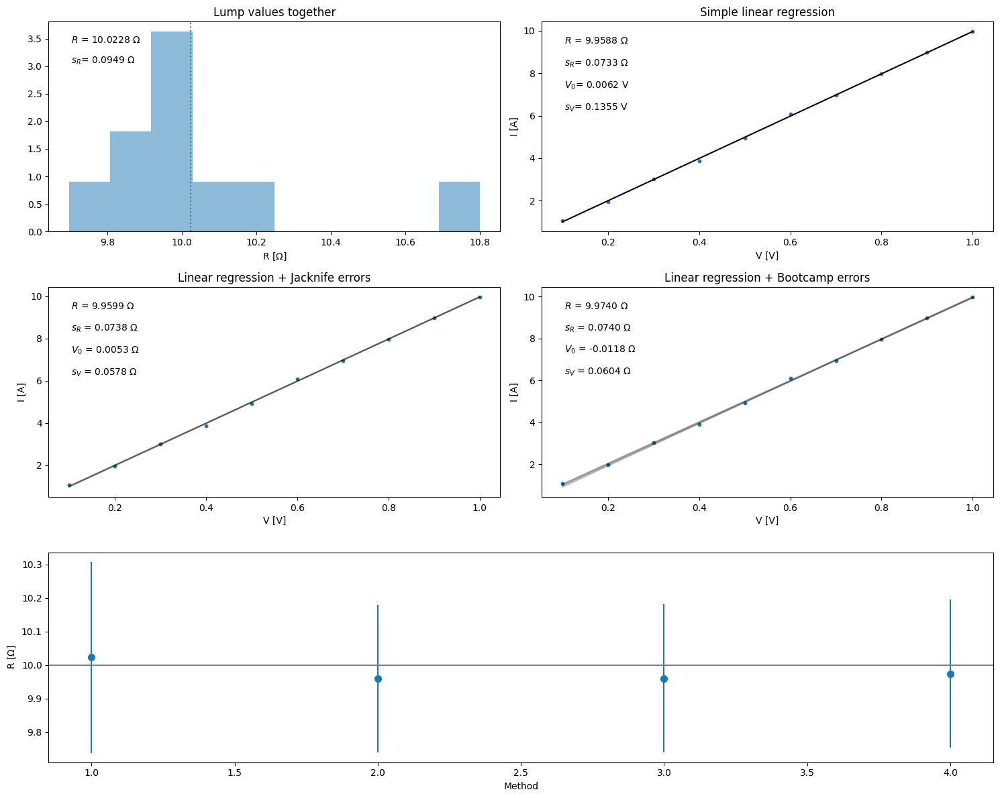

In [ ]:
# @title #####Figure 7: Linear regression

# Fix random seed for reproducibility
np.random.seed(1778)

# LINEAR REGRESSION ============================================================
# Direct implementation of linear regression with errors in y
class SimpleLinearModel:
  def __init__(self, a1=None, a2=None, a1_std=None, a2_std=None):
    self.a1 = a1
    self.a2 = a2
    self.a1_std = a1_std
    self.a2_std = a2_std

  def eval(self, x):
    return self.a1 + self.a2 * x

  def sample(self, x):
    a1 = np.random.normal(self.a1, self.a1_std)
    a2 = np.random.normal(self.a2, self.a2_std)
    return a1 + a2 * x

  def fit(self, x, y, w=None):
    # sources
    # https://en.wikipedia.org/wiki/Simple_linear_regression
    # https://en.wikipedia.org/wiki/Weighted_arithmetic_mean#Weighted_sample_variance

    assert len(x)==len(y), "Error: x and y must have same length"
    if w is None: w = np.ones(len(x))
    # Best Fit Parameters ---
    v_1 = np.sum(w)
    v_2 = np.dot(w,w)
    # weighted means
    x_mean = np.sum(w * x) / v_1
    y_mean = np.sum(w * y) / v_1

    x_xmean = x - x_mean
    y_ymean = y - y_mean
    # weighted variances (unbiased)
    s_xx = np.dot(w * x_xmean, x_xmean) / (v_1 - v_2 / v_1)
    s_yy = np.dot(w * y_ymean, y_ymean) / (v_1 - v_2 / v_1)
    s_xy = np.dot(w * x_xmean, y_ymean) / (v_1 - v_2 / v_1)

    # weighted standard deviations
    s_x = np.sqrt(s_xx)
    s_y = np.sqrt(s_yy)

    self.a2 = s_xy / s_xx
    self.a1 = y_mean - self.a2 * x_mean

    # Correlation Parameter ---
    r_xy = self.a2 * s_x / s_y

    # Standard Errors on Parameters ---
    y_fit = self.eval(x)
    res   = y - y_fit   # residuals
    var   = np.dot(w * res, res) / (v_1 - v_2 / v_1)
    self.a2_std = np.sqrt(var / s_xx)
    self.a1_std = self.a2_std * np.sqrt(np.dot(w * x,x) / (v_1 - v_2 / v_1))


    self.a2_std = np.sqrt(np.dot(res,res) / (len(res)-2) / np.dot(x_xmean,x_xmean))


    return ((self.a1, self.a1_std), (self.a2, self.a2_std), r_xy)


# EXPERIMENT ===================================================================

# In this experiment we measure the voltage - current through a resistance for
# large_n values. Reducing the variance for each vaue of I by taking different
# measurements and averaging is not helpful. The reduction in overall
# uncertainty is the same that can be achieved with the same number of datapoints
# spread over different values of I. The latter is preferable, as it allows
# to test the linear relationship.

# That does not mean that the ampmeter is perfect, an error in it just
# traslates into larger spread over the V axis. We assume the errors in I and V
# are uncorrelated.

@interact(n_meas=widgets.IntSlider(min=10, max=200, step=10, value=10,
                                 description="Measurements"),
          v_err=widgets.FloatSlider(min=0.01, max=0.1, step=0.01,
                                    description="Voltmeter precision"),
          i_err=widgets.FloatSlider(min=0.01, max=0.1, step=0.01,
                                    description="Ampmeter precision"),
          v_bias=widgets.FloatSlider(min=0, max=1, step=0.1,
                                    description="Voltmeter bias")
          )
def experiment(n_meas, v_err, i_err, v_bias=0):
  # Truth
  R_true = 10.0   # True value of resistance, in Ohm
  # Design parameters
  bias = v_bias   # Additive bias, in V

  n = n_meas  # number of I values sampled

  s_i = i_err   # ammeter precision, in Amps
  s_v = v_err   # voltmeter precision, in Volts

  sigma_level = 3   # significance level for uncertainties

  # Experimenter chooses series of values of intensity to measure
  I_vals = np.linspace(0.1, 1.0, n)
  # True intensity is different from measured intensity
  I_true = np.random.normal(I_vals, s_i, size=n)
  # The true voltage depends on the true intensity and true resistance
  V_true = R_true * I_true
  # The measured voltage difers from the true voltage
  V_meas = np.random.normal(V_true, s_v) + bias

  # ANALYSIS =====================================================================
  # Truth ------------------------------------------------------------------------
  s_R        = R_true * np.sqrt((s_v / V_true)**2 + (s_i / I_true)**2) / np.sqrt(n)
  # Method 0 ---------------------------------------------------------------------
  # Consider each data point as independent
  ###R_s        = np.array([x[1,:] / x[0,:] for x in meas])
  R_s        = V_meas / I_vals
  R_mean     = np.mean(R_s)
  R_std      = np.std(R_s, ddof=1)
  R_mean_std = R_std / np.sqrt(n)

  # Method 1 ---------------------------------------------------------------------
  # Simple linear regression, without weighting differently the points
  model_1 = SimpleLinearModel()
  _ = model_1.fit(I_vals, V_meas, w=None)

  # Method 2 ---------------------------------------------------------------------
  # Simple linear regression + Jacknife estimation of errors
  mod_jack = []
  for i in range(n):
    temp_I = np.delete(I_vals, i)
    temp_V = np.delete(V_meas, i)
    temp_model = SimpleLinearModel()
    _          = temp_model.fit(temp_I, temp_V)
    mod_jack.append(temp_model)
  jack_a1     = np.mean([mod.a1 for mod in mod_jack])
  jack_a1_std = np.sqrt(n) * np.std([mod.a1 for mod in mod_jack])
  jack_a2     = np.mean([mod.a2 for mod in mod_jack])
  jack_a2_std = np.sqrt(n) * np.std([mod.a2 for mod in mod_jack])

  # Method 3 ---------------------------------------------------------------------
  # Simple linear regression + Bootstrap estimation of errors
  mod_boot = []
  for i in range(n):
    samples    = np.random.choice(np.arange(n), size=n)
    temp_I     = I_vals[samples]
    temp_V     = V_meas[samples]
    temp_model = SimpleLinearModel()
    _          = temp_model.fit(temp_I, temp_V)
    mod_boot.append(temp_model)
  boot_a1     = np.mean([mod.a1 for mod in mod_boot])
  boot_a1_std = np.std([mod.a1 for mod in mod_boot])
  boot_a2     = np.mean([mod.a2 for mod in mod_boot])
  boot_a2_std = np.std([mod.a2 for mod in mod_boot])

  # PLOT =========================================================================

  fig = plt.figure(tight_layout=True, figsize=(15,12))
  gs = gridspec.GridSpec(3,2, figure=fig)

  # Method 0: lump all values together -------------------------------------------
  ax = fig.add_subplot(gs[0, 0])
  _ = ax.hist(R_s, density=True, alpha=0.5)
  _ = ax.axvline(R_mean, linestyle=':', color='tab:blue')
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.9 * ax.get_ylim()[1], r"$R$ = {:.4f} $\Omega$".format(R_mean),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.8 * ax.get_ylim()[1], r"$s_R$= {:.4f} $\Omega$".format(R_mean_std),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.set_title(r"Lump values together")
  _ = ax.set_xlabel(r"R [$\Omega$]")

  # Method 1: Simple linear regression -------------------------------------------
  ax = fig.add_subplot(gs[0, 1])
  _ = ax.scatter(I_vals, V_meas, s=10, c='tab:blue', alpha=1.)
  _ = ax.plot(I_vals, model_1.eval(I_vals), c="black")
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.9 * ax.get_ylim()[1], r"$R$ = {:.4f} $\Omega$".format(model_1.a2),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.8 * ax.get_ylim()[1], r"$s_R$= {:.4f} $\Omega$".format(model_1.a2_std),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.7 * ax.get_ylim()[1], r"$V_0$= {:.4f} V".format(model_1.a1),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.6 * ax.get_ylim()[1], r"$s_V$= {:.4f} V".format(model_1.a1_std),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.set_title(r"Simple linear regression")
  _ = ax.set_xlabel(r"V [V]")
  _ = ax.set_ylabel(r"I [A]")

  # Method 2: Simple linear regression + jacknife --------------------------------
  ax = fig.add_subplot(gs[1, 0])
  _ = ax.scatter(I_vals, V_meas, s=10, c='tab:blue', alpha=1.)
  _ = [ax.plot(I_vals, mod.eval(I_vals), c='black', alpha=1/n) for mod in mod_jack]
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.9 * ax.get_ylim()[1], r"$R$ = {:.4f} $\Omega$".format(jack_a2),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.8 * ax.get_ylim()[1], r"$s_R$ = {:.4f} $\Omega$".format(jack_a2_std),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.7 * ax.get_ylim()[1], r"$V_0$ = {:.4f} $\Omega$".format(jack_a1),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.6 * ax.get_ylim()[1], r"$s_V$ = {:.4f} $\Omega$".format(jack_a1_std),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.set_title(r"Linear regression + Jacknife errors")
  _ = ax.set_xlabel(r"V [V]")
  _ = ax.set_ylabel(r"I [A]")

  # Method 3: Simple linear regression + bootcamp --------------------------------
  ax = fig.add_subplot(gs[1, 1])
  _ = ax.scatter(I_vals, V_meas, s=10, c='tab:blue', alpha=1.)
  _ = [ax.plot(I_vals, mod.eval(I_vals), c='black', alpha=1/n) for mod in mod_boot]
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.9 * ax.get_ylim()[1], r"$R$ = {:.4f} $\Omega$".format(boot_a2),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.8 * ax.get_ylim()[1], r"$s_R$ = {:.4f} $\Omega$".format(boot_a2_std),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.7 * ax.get_ylim()[1], r"$V_0$ = {:.4f} $\Omega$".format(boot_a1),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.text(ax.get_xlim()[0] + 0.05 * (ax.get_xlim()[1]-ax.get_xlim()[0]),
            0.6 * ax.get_ylim()[1], r"$s_V$ = {:.4f} $\Omega$".format(boot_a1_std),
            bbox=dict(boxstyle="round", fc="white", ec="None", alpha=0.5))
  _ = ax.set_title(r"Linear regression + Bootcamp errors")
  _ = ax.set_xlabel(r"V [V]")
  _ = ax.set_ylabel(r"I [A]")

  # Comparison of statistics -----------------------------------------------------
  ax = fig.add_subplot(gs[2,:])
  x_labels =     np.array([1 ,         2,              3,           4])
  means    =     np.array([R_mean,     model_1.a2,     jack_a2,     boot_a2])
  errors   = sigma_level * np.array([R_mean_std, model_1.a2_std, jack_a2_std, boot_a2_std])
  _ = ax.scatter(x_labels, means, s=50)
  _ = ax.errorbar(x = x_labels, y = means, yerr = errors, linestyle='None')
  _ = ax.axhline(R_true, color="gray")
  #_ = ax.axhline(R_true + 3 * s_R.mean(), color="gray", linestyle=":")
  #_ = ax.axhline(R_true - 3 * s_R.mean(), color="gray", linestyle=":")
  _ = ax.set_xlabel(r"Method")
  _ = ax.set_ylabel(r"R [$\Omega$]")

  plt.show()

**Figure 7 (interactive):** Comparison of error analyses. Experiment consists in the estimation of electric resistance by means of intensity-voltage measurements. *Upper left panel:* computing a point estimate for each V-I measurement, these measurements are treated as independent, and the standard deviation of the standard mean is used as an estimate for the uncertainty. *Upper right panel:* Result from a simple linear regression analysis. *Middle left panel:* Linear regression, estimating uncertainty in the parameters using Jacknife resampling. *Middle right panel:* Linear regression, estimating uncertainty in the parameters using Bootstrap resampling. *Low panel:* Comparison of results.

If the uncertainty found through linear regression is similar to the one found using the standard deviation of the standard mean, why use it? There are two reasons. First, by doing a linear regression we are not just estimating the value of a parameter (in this case electric resistance), but also a functional relationship between variables. Second, we can account for biases in our instruments. Biases are systematic errors, and cannot be reduced by increasing the number of measurements.